Apply Data Cleaning to the Datasets and then apply Kmeans algorithm for find pattern and the best value of.the K for the following features.

1. Use feautes fixed acidity and volatile acidity
2. Use feautes Cirtic acidity and fixed acidity
3. Use feautes residual suger and sulphades
4. Use feautes free.sulfur.dioxide and total.sulfur.dioxide
5. Use feautes fixed acidity, citric acidity and volatile acidity
5. Use feautes density and pH


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [85]:
df = pd.read_csv('winequality-red.csv')

df.shape

(1599, 12)

In [3]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

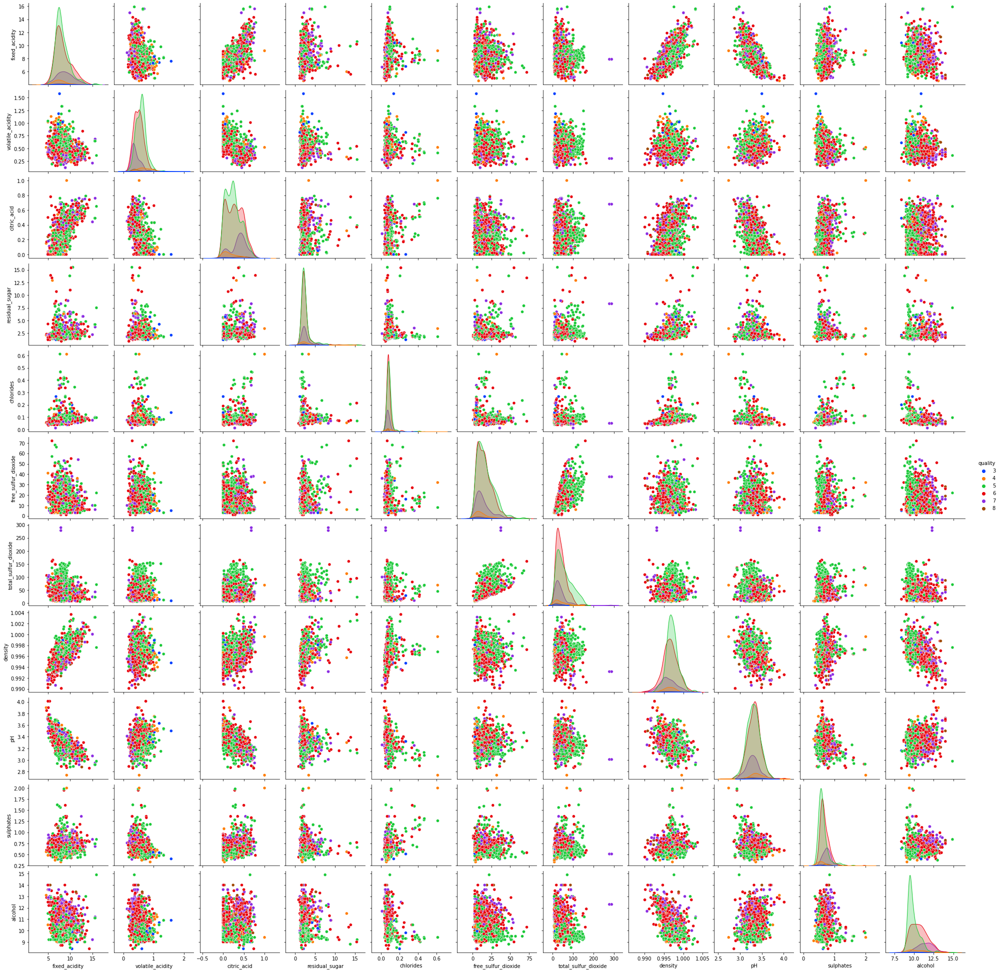

In [18]:
sns.pairplot(df,hue='quality',diag_kind='kde',palette='bright')

In [6]:
xp = df.drop(columns='quality')
y = df['quality']

In [9]:
xp.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


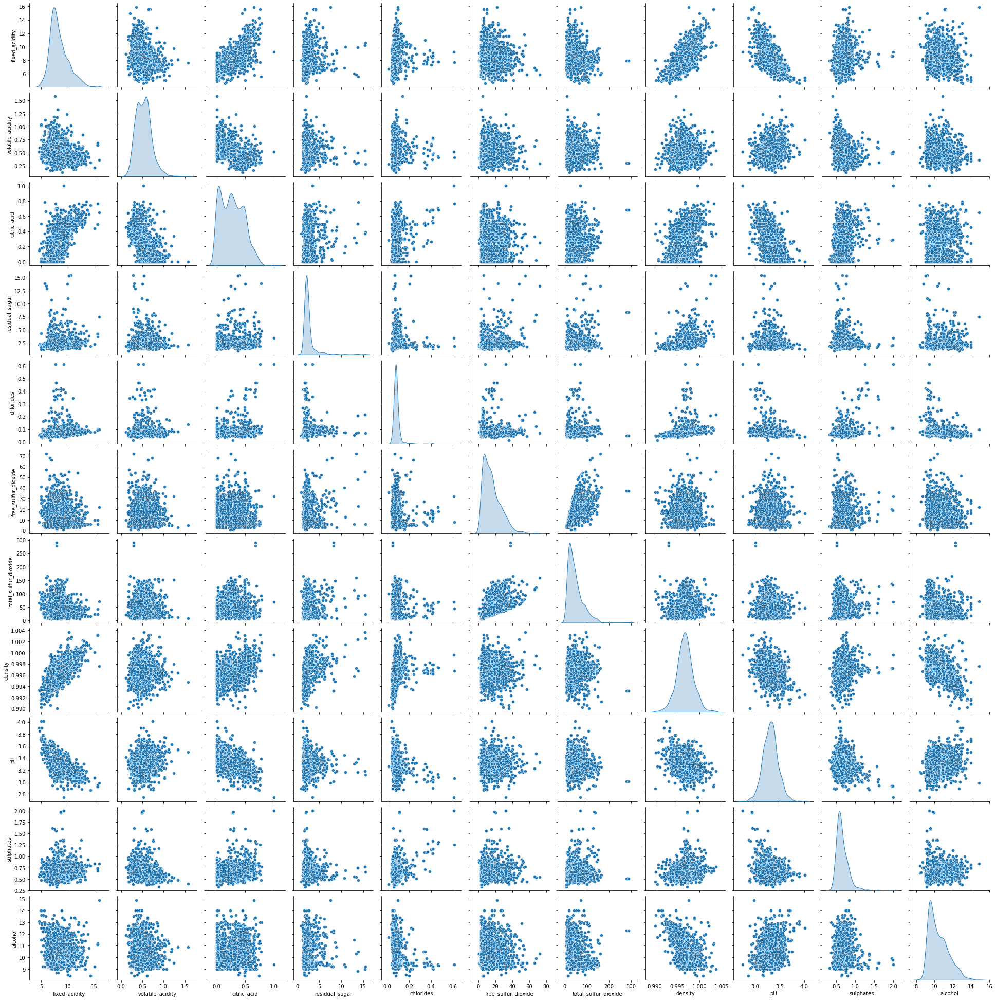

In [19]:
sns.pairplot(xp,diag_kind='kde')

In [22]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer()

x = pt.fit_transform(xp)
x = pd.DataFrame(x,columns=xp.columns)

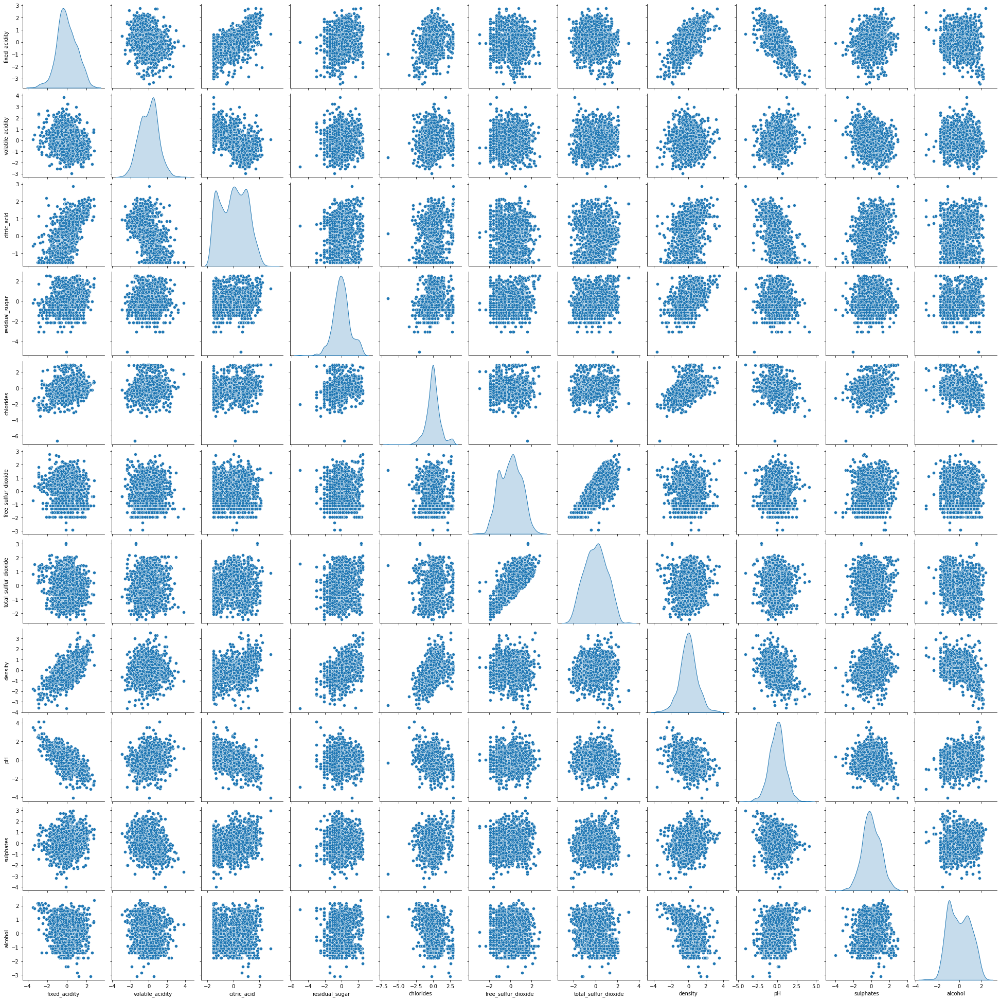

In [24]:
sns.pairplot(x,diag_kind='kde')

In [145]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score

cluster_range = np.arange(1,16)
cluster_errors = []
sil_score=[]
sil_samp =[]

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x)
    labels = c.labels_
    centroid = c.cluster_centers_
    cluster_errors.append(c.inertia_)

k_means = [KMeans(n_clusters=i,random_state=4).fit(x) for i in range(1,16)]
sil_score = [silhouette_score(x,k.labels_) for k in k_means[1:]]

In [146]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_errors})

,No of Clusters,Cluster Errors
0,1,17589.000000
1,2,14242.588255
2,3,12520.976993
3,4,11355.654708
4,5,10552.679921
5,6,10033.569693
6,7,9657.476023
7,8,9239.482409
8,9,8918.415984
9,10,8630.415007


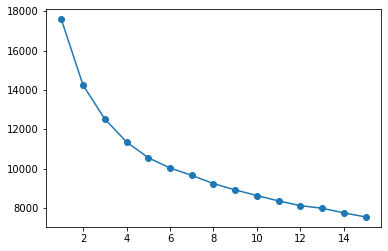

In [147]:
plt.plot(cluster_range,cluster_errors,marker='o')

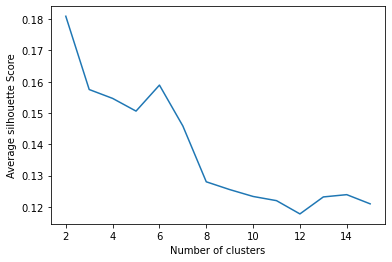

In [148]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

The silhouette score is highest for 2 clusters, but we can see that the elbow plot is not giving a clear indication at 2 clusters.

### 1. Use feautes fixed acidity and volatile acidity

In [31]:
x1 = x[['fixed_acidity','volatile_acidity']]

In [151]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x1)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_
    
k_means = [KMeans(n_clusters=i,random_state=4).fit(x1) for i in range(1,16)]
sil_score = [silhouette_score(x1,k.labels_) for k in k_means[1:]]

In [152]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,3198.000000
1,2,1802.449119
2,3,1318.923515
3,4,1051.094588
4,5,880.746155
5,6,738.359825
6,7,648.179519
7,8,576.216092
8,9,508.527923
9,10,461.659306


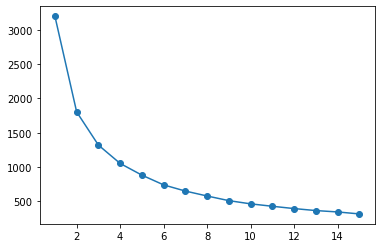

In [153]:
plt.plot(cluster_range,cluster_error,marker='o')

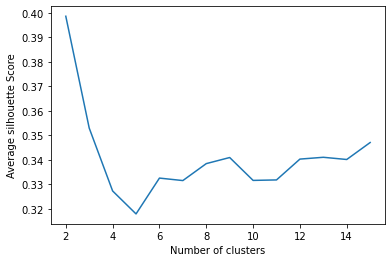

In [154]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

From the elbow plot we can say 2 clusters are good as the drop in error after 2 cluster is very small as compared to before 3, and the avg silhouette score is highest for 2 clusters

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.3986205208896445


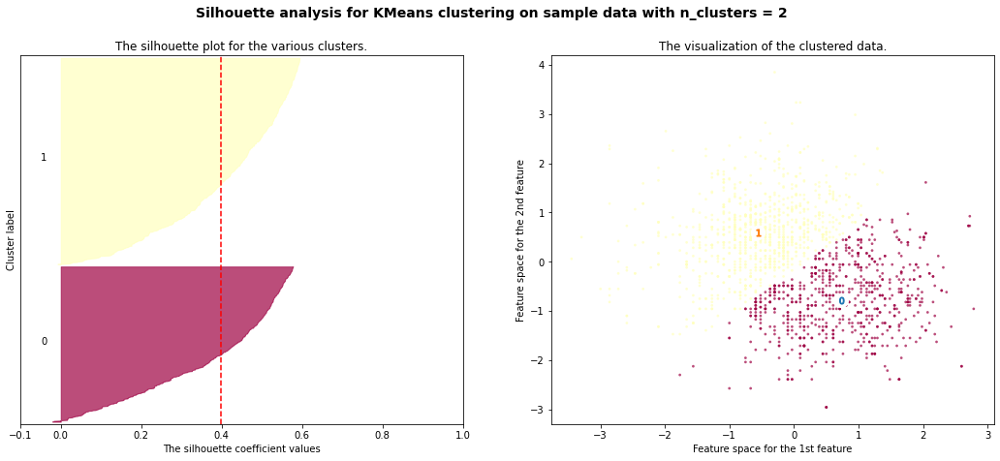

For n_clusters = 3 The average silhouette_score is : 0.3530161937262932


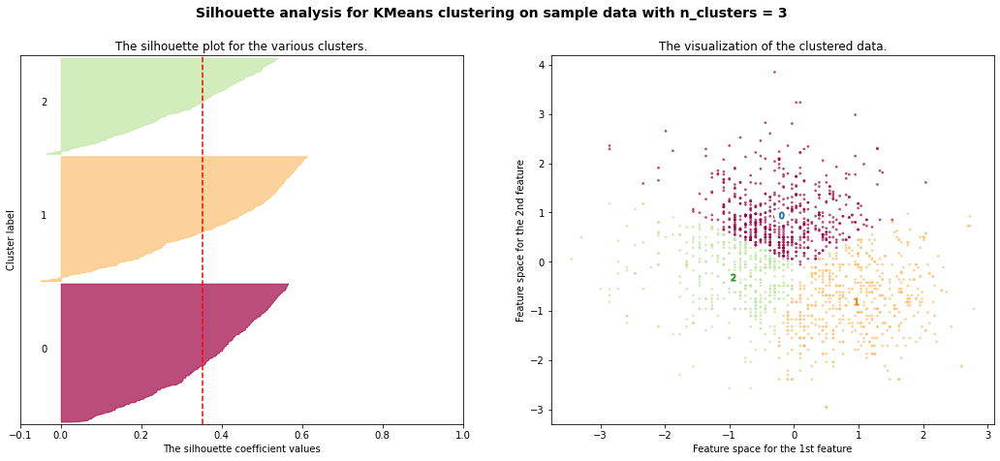

For n_clusters = 4 The average silhouette_score is : 0.32977383121638365


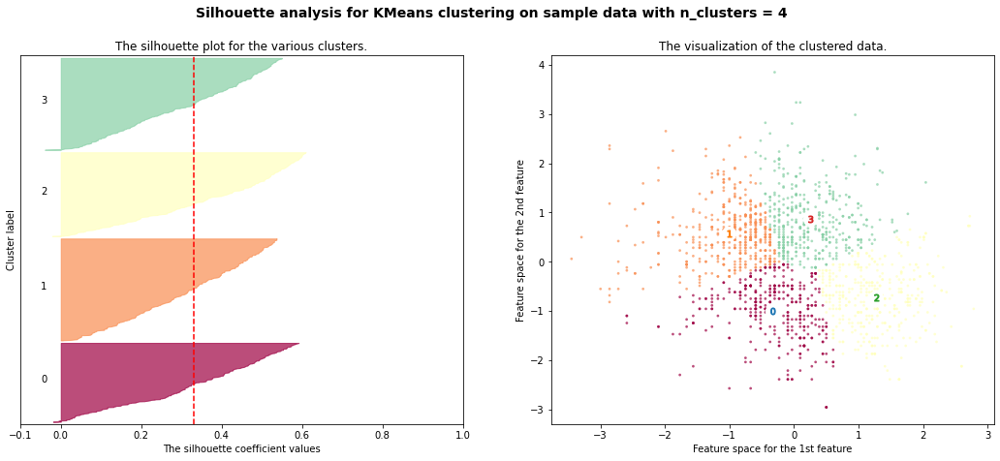

For n_clusters = 5 The average silhouette_score is : 0.3157066936815279


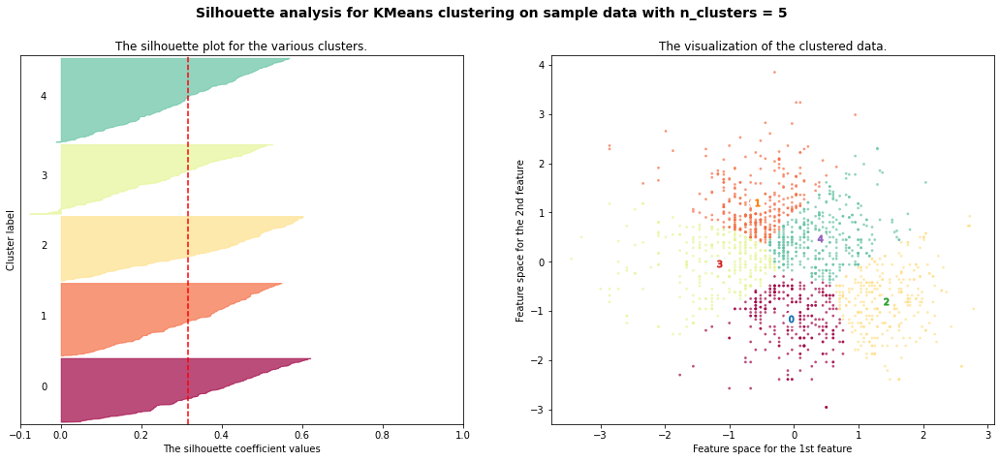

For n_clusters = 6 The average silhouette_score is : 0.33964335492754183


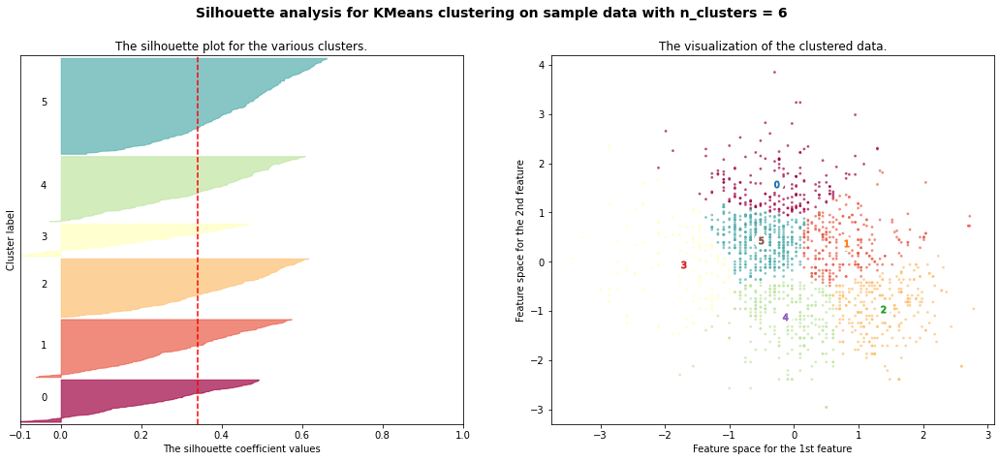

For n_clusters = 7 The average silhouette_score is : 0.32948839199985774


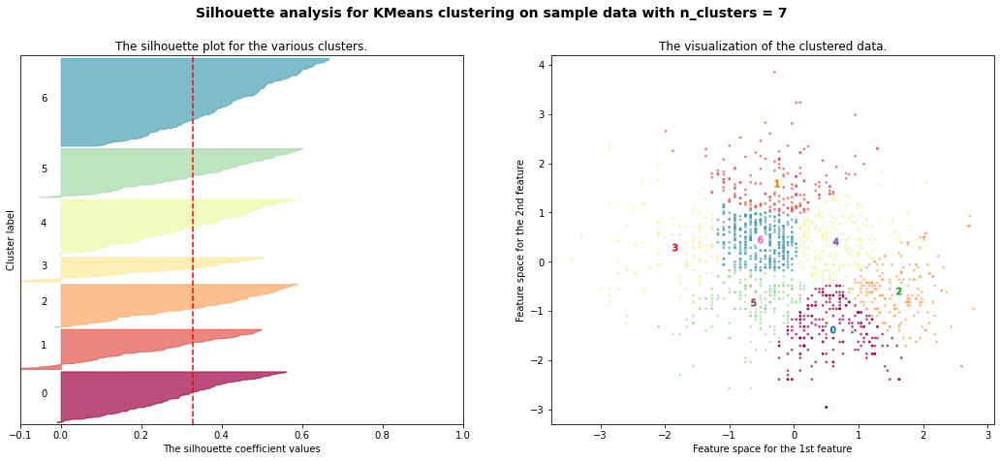

For n_clusters = 8 The average silhouette_score is : 0.3324895457091855


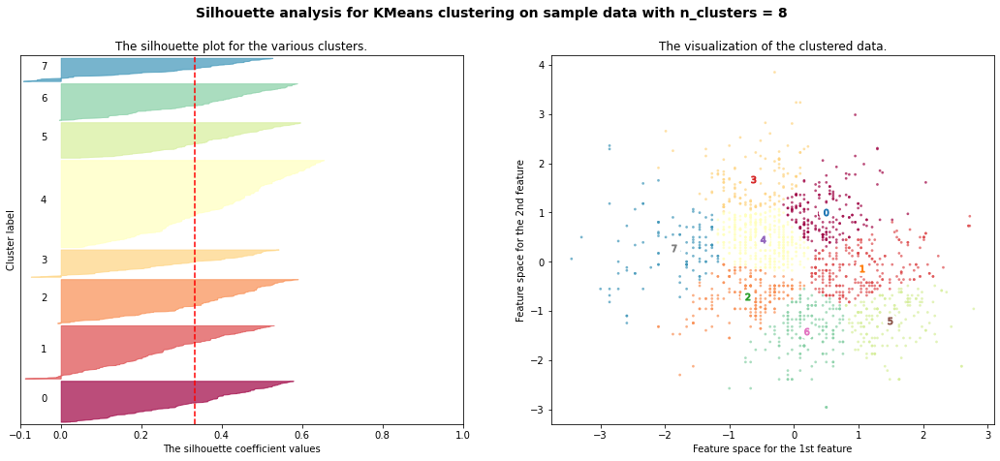

For n_clusters = 9 The average silhouette_score is : 0.3459081774147895


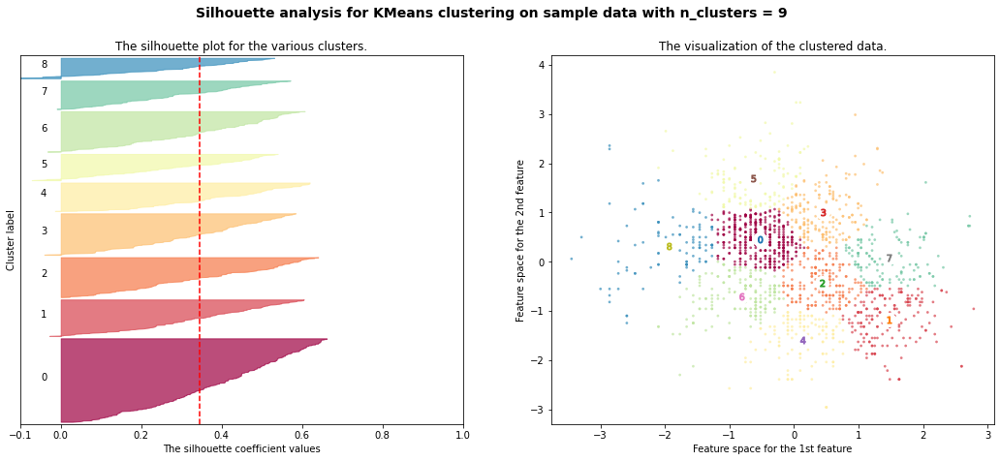

For n_clusters = 10 The average silhouette_score is : 0.3299603754104023


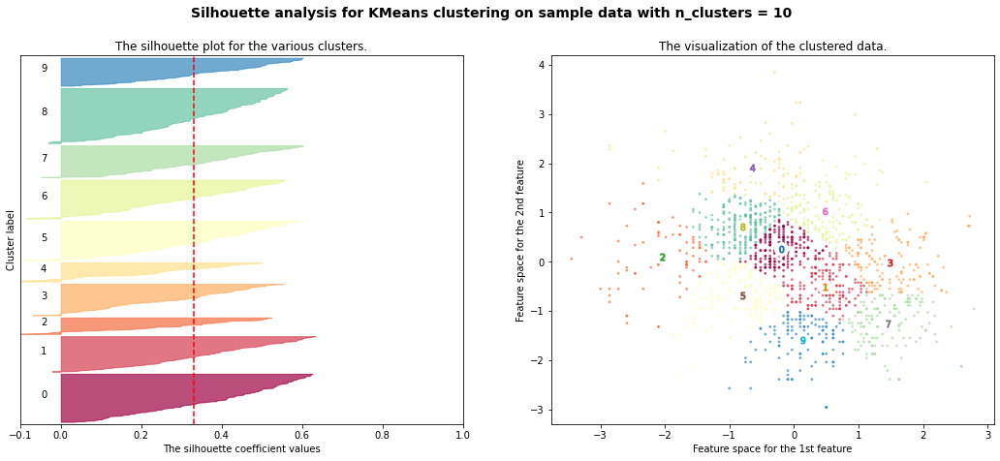

For n_clusters = 11 The average silhouette_score is : 0.333570623676475


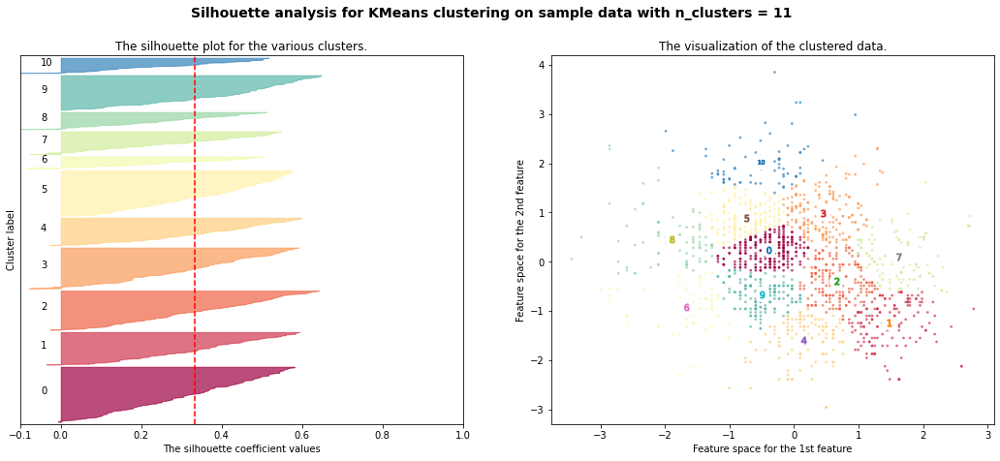

For n_clusters = 12 The average silhouette_score is : 0.33036603655960367


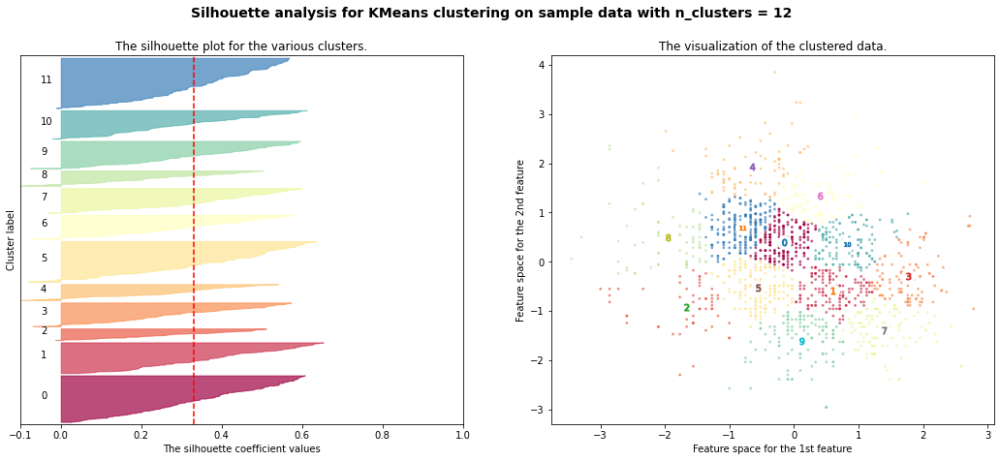

For n_clusters = 13 The average silhouette_score is : 0.33137704474142693


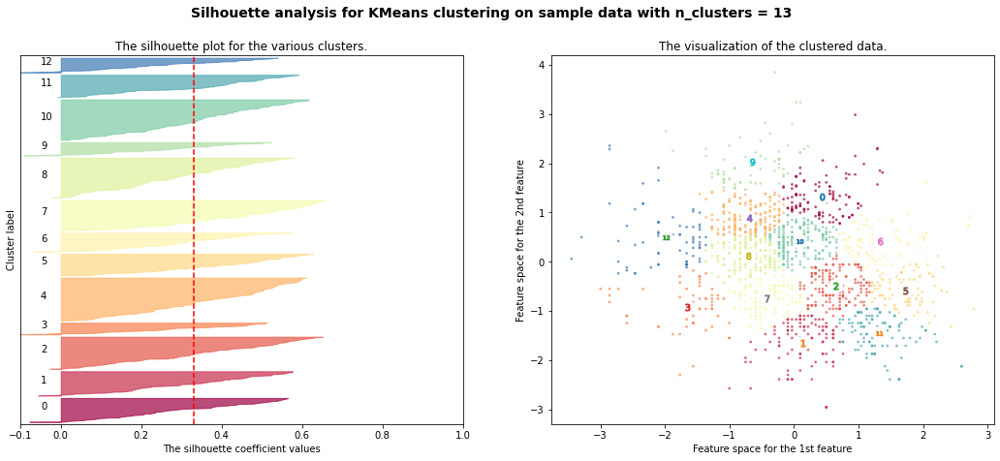

For n_clusters = 14 The average silhouette_score is : 0.33440213827829446


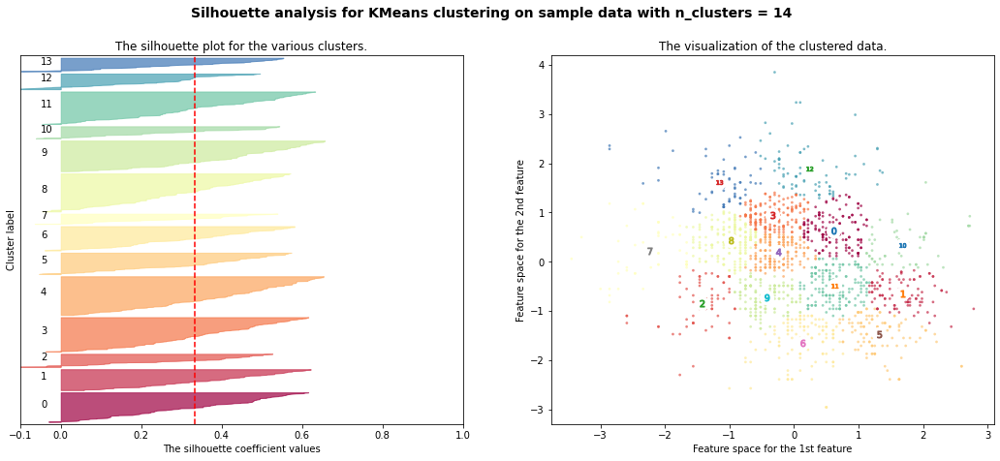

For n_clusters = 15 The average silhouette_score is : 0.34130373923340196


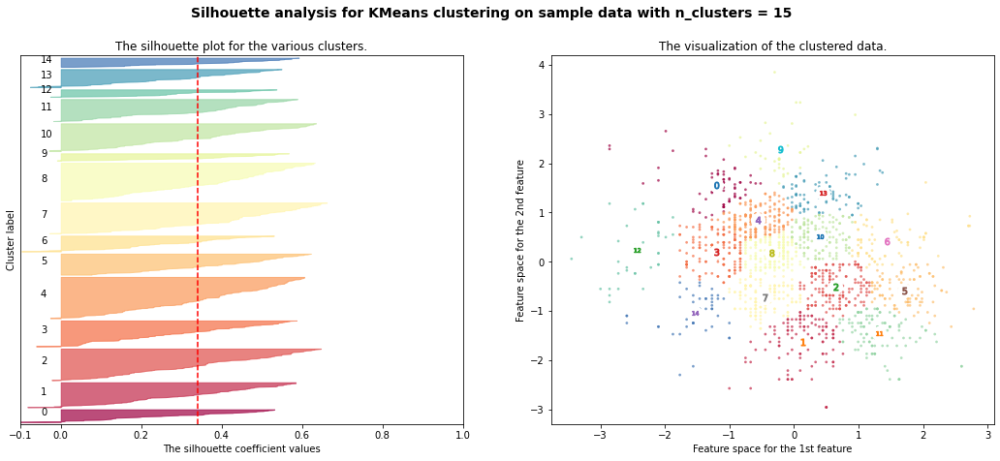

In [71]:
from __future__ import print_function
%matplotlib inline


from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X = x1.values
range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10,11,12,13,14,15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,n_init=15, random_state=2)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

### 2. Use feautes Cirtic acidity and fixed acidity

In [36]:
x2 = x[['citric_acid','fixed_acidity']]

In [155]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x2)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_
    
k_means = [KMeans(n_clusters=i,random_state=4).fit(x2) for i in range(1,16)]
sil_score = [silhouette_score(x2,k.labels_) for k in k_means[1:]]

In [38]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,3198.000000
1,2,1358.997591
2,3,909.626409
3,4,728.488965
4,5,585.655616
5,6,479.632305
6,7,421.401513
7,8,368.614392
8,9,328.578128
9,10,295.097087


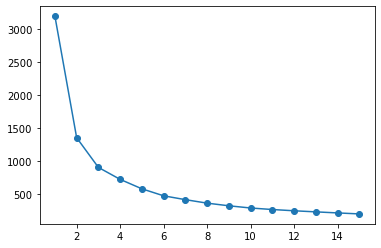

In [39]:
plt.plot(cluster_range,cluster_error,marker='o')

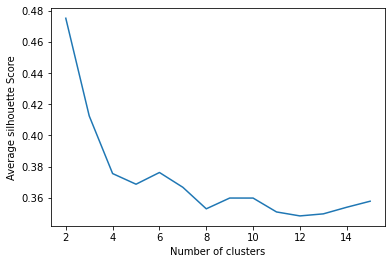

In [156]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

In this case the 2 clusters seem to be a good value, the avg silhouette score is max at 2 clusters

### 3. Use feautes residual suger and sulphades

In [40]:
x3 = x[['sulphates','residual_sugar']]

In [161]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x3)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_
    
k_means = [KMeans(n_clusters=i,random_state=4).fit(x3) for i in range(1,16)]
sil_score = [silhouette_score(x3,k.labels_) for k in k_means[1:]]

In [42]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,3198.000000
1,2,2165.916859
2,3,1486.459926
3,4,1211.135190
4,5,994.157202
5,6,826.731301
6,7,731.841845
7,8,630.507252
8,9,570.662385
9,10,509.145650


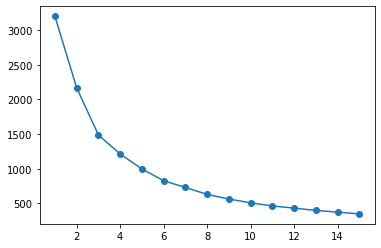

In [163]:
plt.plot(cluster_range,cluster_error,marker='o')

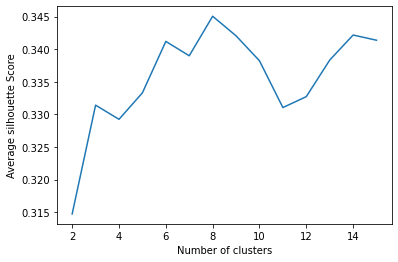

In [162]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.3150199587735626


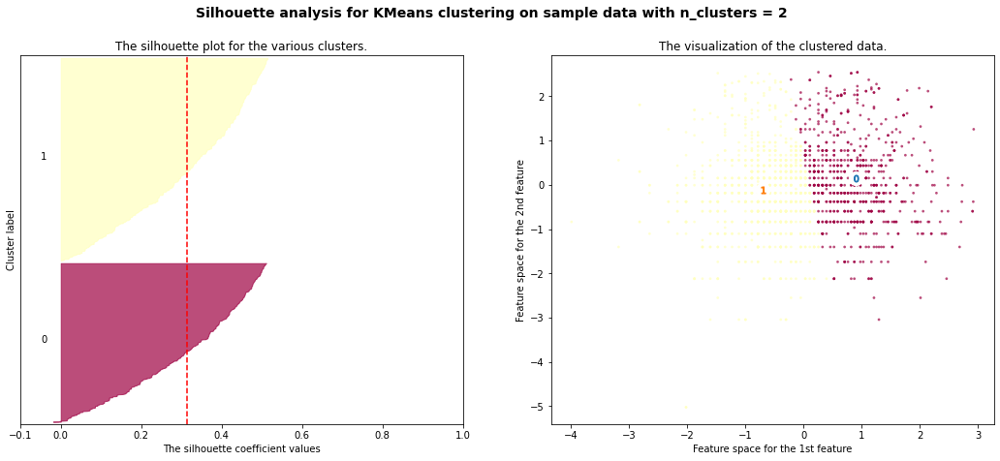

For n_clusters = 3 The average silhouette_score is : 0.33142221622379714


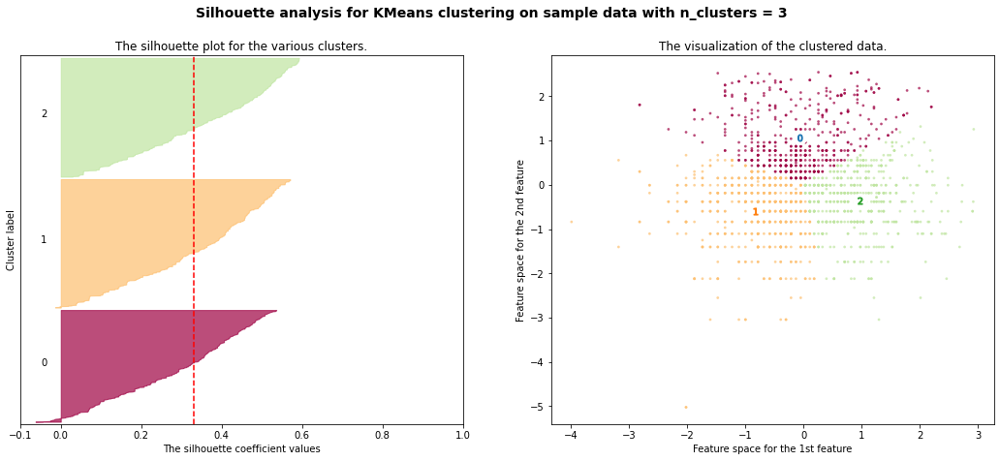

For n_clusters = 4 The average silhouette_score is : 0.3310899615257897


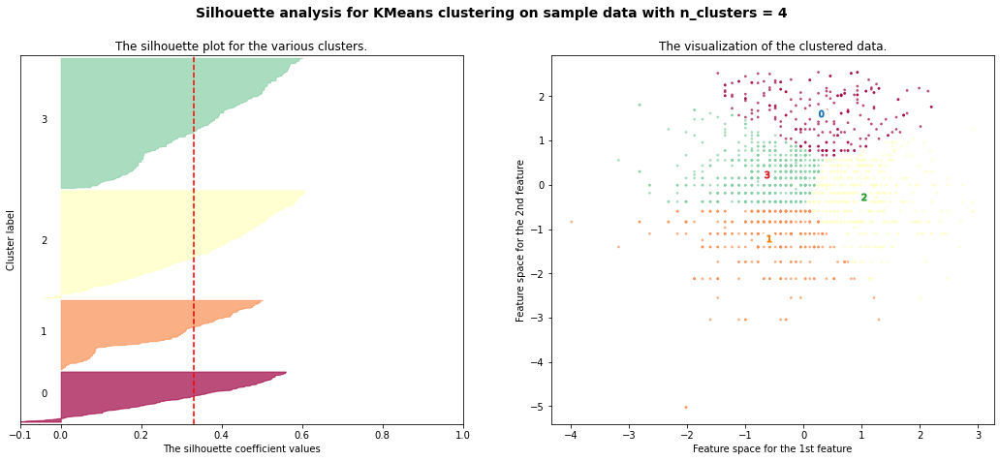

For n_clusters = 5 The average silhouette_score is : 0.3333093575549378


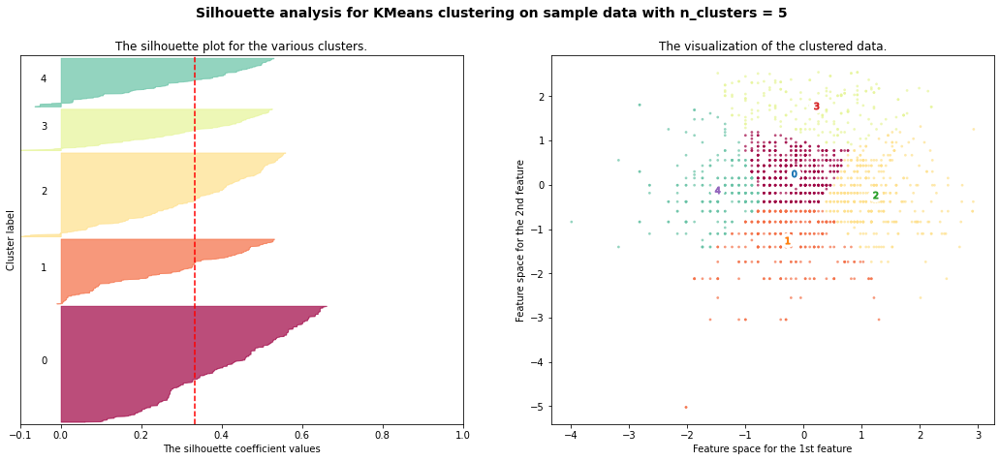

For n_clusters = 6 The average silhouette_score is : 0.33837108693411877


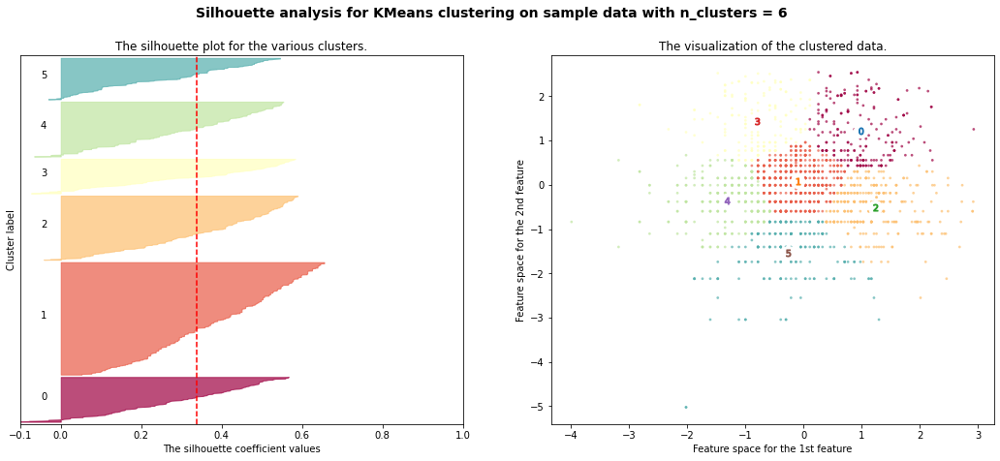

For n_clusters = 7 The average silhouette_score is : 0.3369729479148809


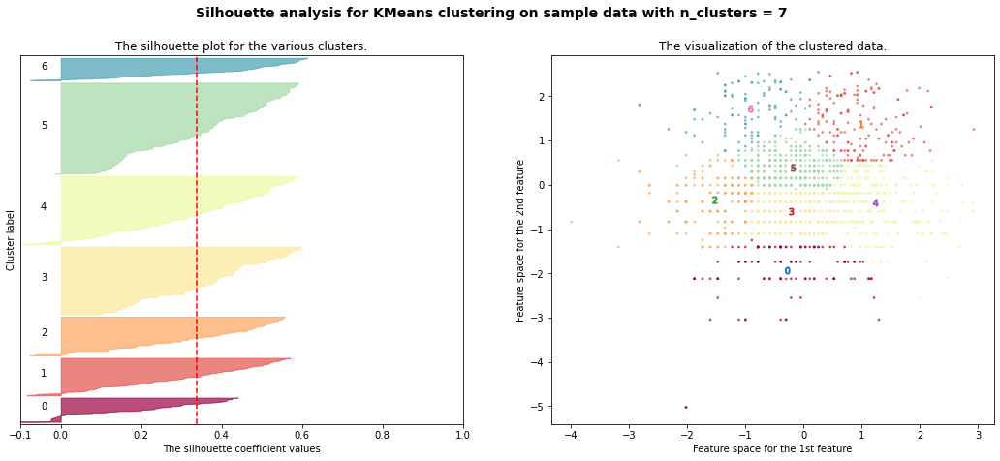

For n_clusters = 8 The average silhouette_score is : 0.34550367347748767


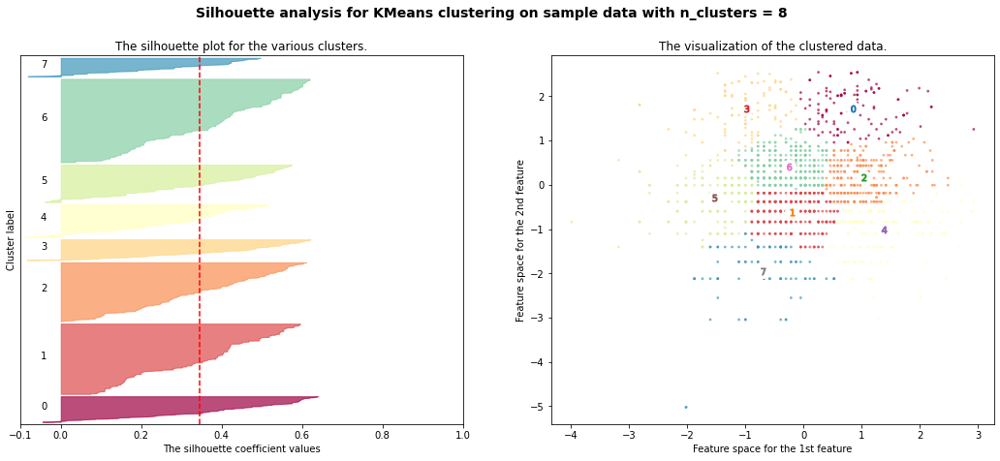

For n_clusters = 9 The average silhouette_score is : 0.3425893768165361


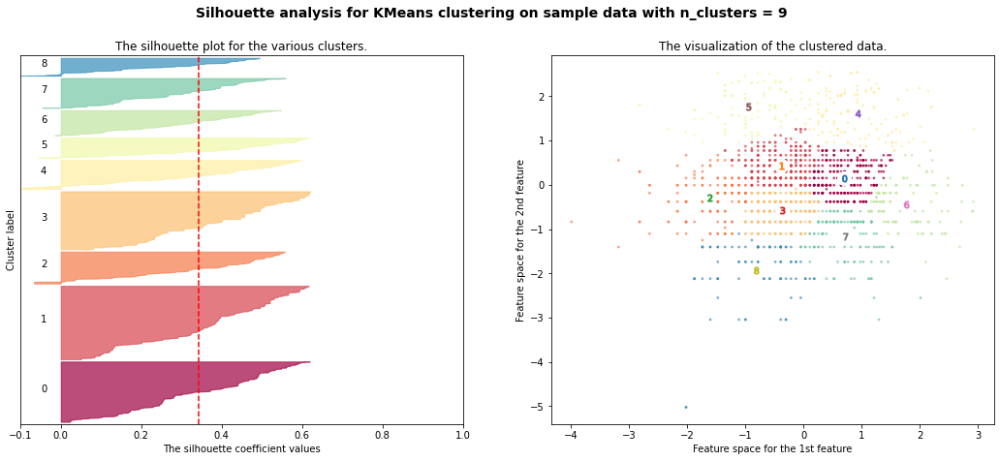

For n_clusters = 10 The average silhouette_score is : 0.34295314772661717


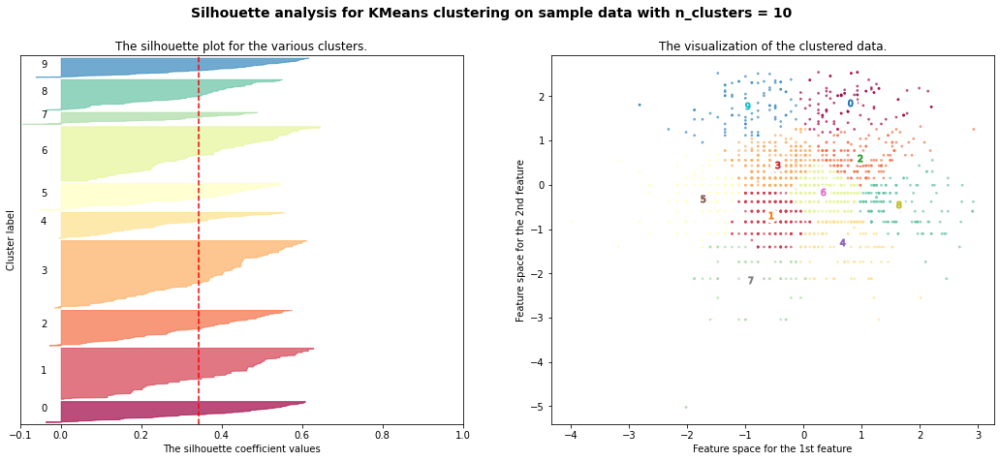

For n_clusters = 11 The average silhouette_score is : 0.33461369269910574


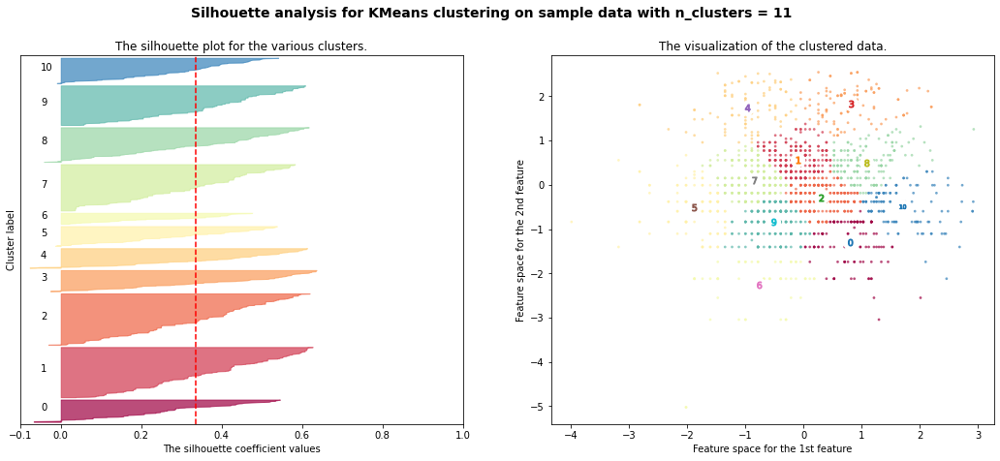

For n_clusters = 12 The average silhouette_score is : 0.338315951836243


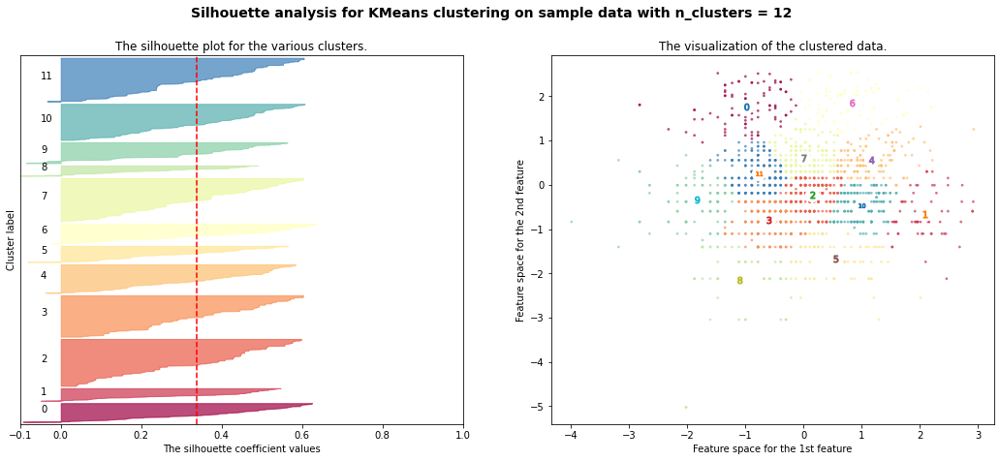

For n_clusters = 13 The average silhouette_score is : 0.3389299867450541


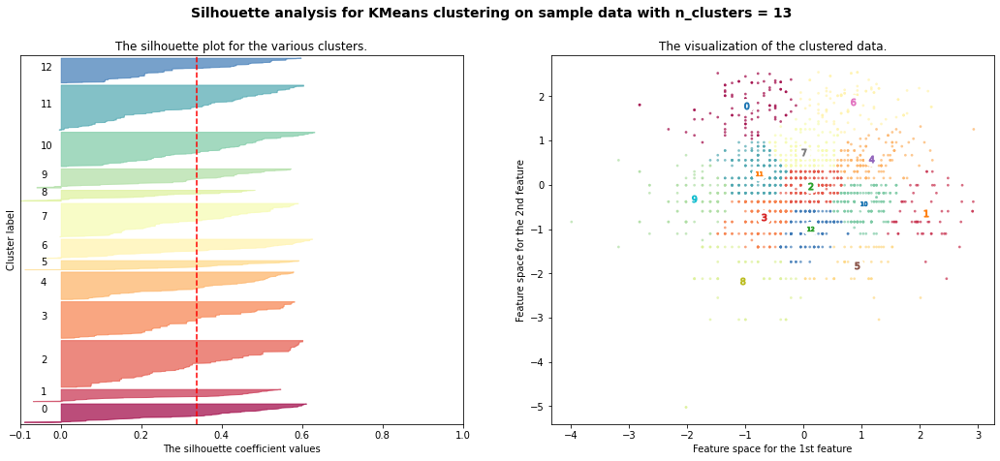

For n_clusters = 14 The average silhouette_score is : 0.329240011692908


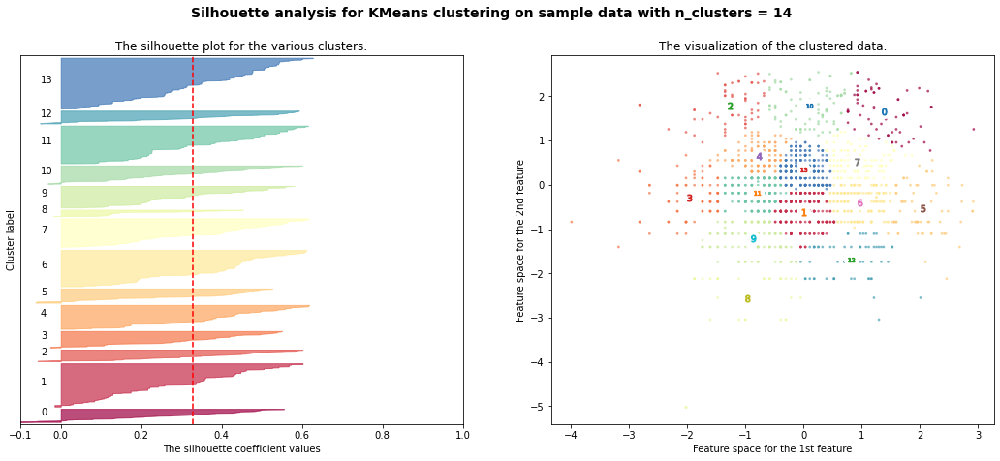

For n_clusters = 15 The average silhouette_score is : 0.3393672643607725


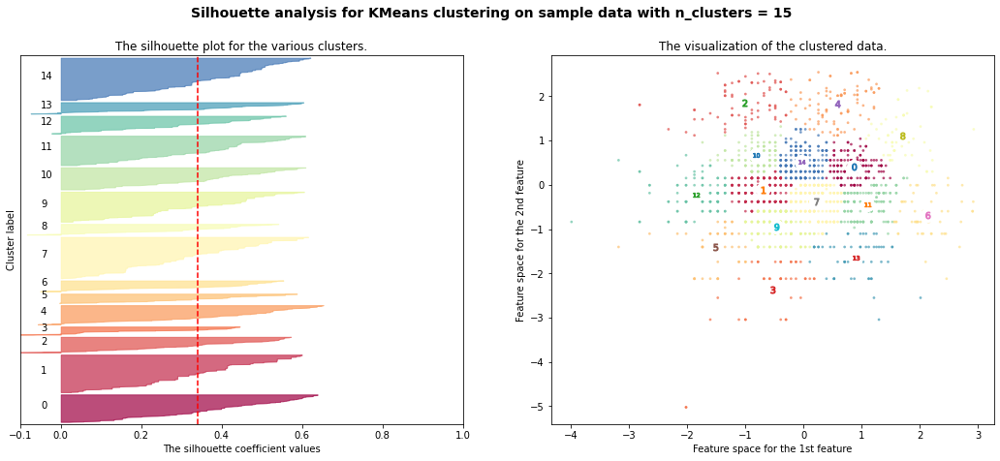

In [164]:
from __future__ import print_function
%matplotlib inline


from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X = x3.values
range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10,11,12,13,14,15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,n_init=15, random_state=2)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In this case the 8 clusters seem to be a good value, the avg silhouette score is max at 8 clusters. But the width of each cluster is not uniform at 8 cluster.

### 4. Use feautes free.sulfur.dioxide and total.sulfur.dioxide

In [45]:
x4 = x[['free_sulfur_dioxide','total_sulfur_dioxide']]

In [165]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x4)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_
    
k_means = [KMeans(n_clusters=i,random_state=4).fit(x4) for i in range(1,16)]
sil_score = [silhouette_score(x4,k.labels_) for k in k_means[1:]]

In [47]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,3198.000000
1,2,1191.579987
2,3,749.517992
3,4,598.080945
4,5,486.204751
5,6,392.154731
6,7,345.877076
7,8,304.200749
8,9,276.125756
9,10,248.288982


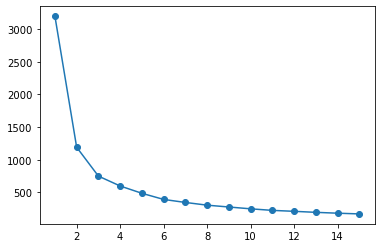

In [48]:
plt.plot(cluster_range,cluster_error,marker='o')

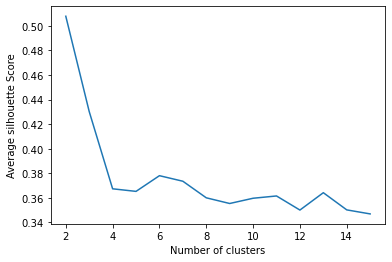

In [166]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

2 clusters is the best option to go with

### 5. Use feautes fixed acidity, citric acidity and volatile acidity

In [49]:
x5 = x[['fixed_acidity','citric_acid','volatile_acidity']]

In [167]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x5)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_

k_means = [KMeans(n_clusters=i,random_state=4).fit(x5) for i in range(1,16)]
sil_score = [silhouette_score(x5,k.labels_) for k in k_means[1:]]

In [73]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,4797.000000
1,2,2444.144407
2,3,1937.967558
3,4,1534.073353
4,5,1329.252649
5,6,1218.716139
6,7,1078.313787
7,8,991.811313
8,9,915.132062
9,10,846.138864


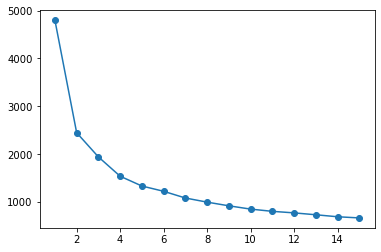

In [74]:
plt.plot(cluster_range,cluster_error,marker='o')

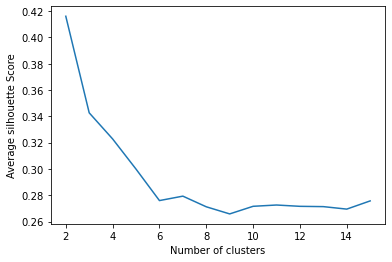

In [168]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.4160949125981785


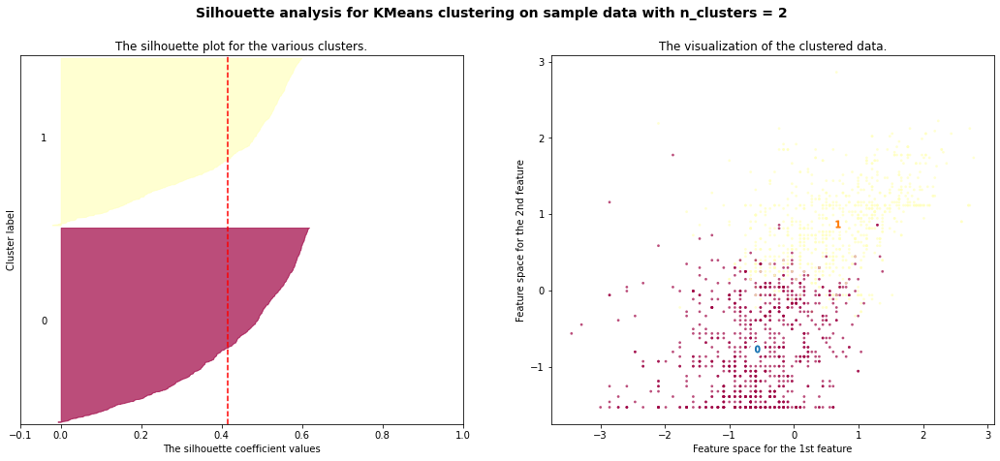

For n_clusters = 3 The average silhouette_score is : 0.3414883339492706


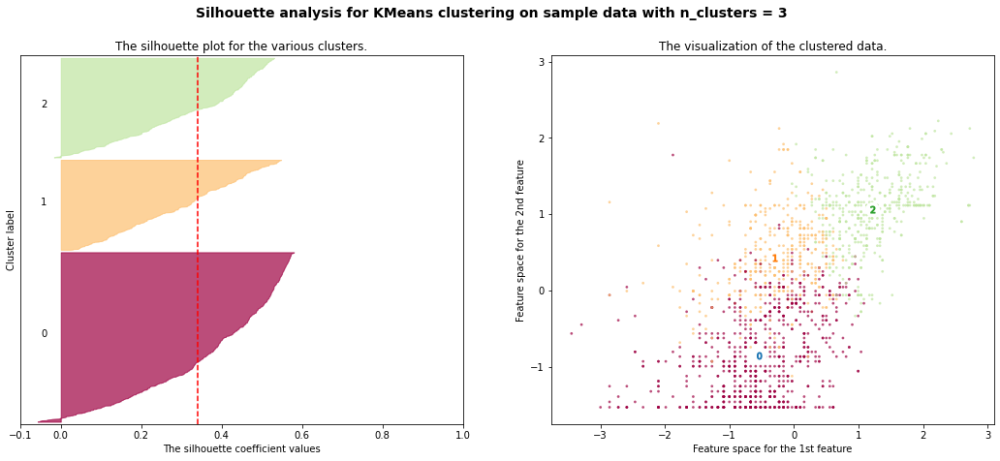

For n_clusters = 4 The average silhouette_score is : 0.32280521445120214


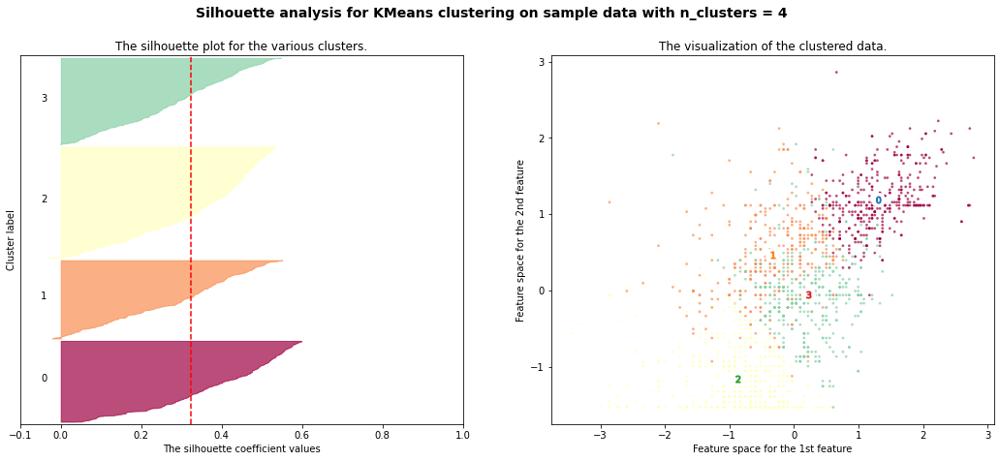

For n_clusters = 5 The average silhouette_score is : 0.2998616710922611


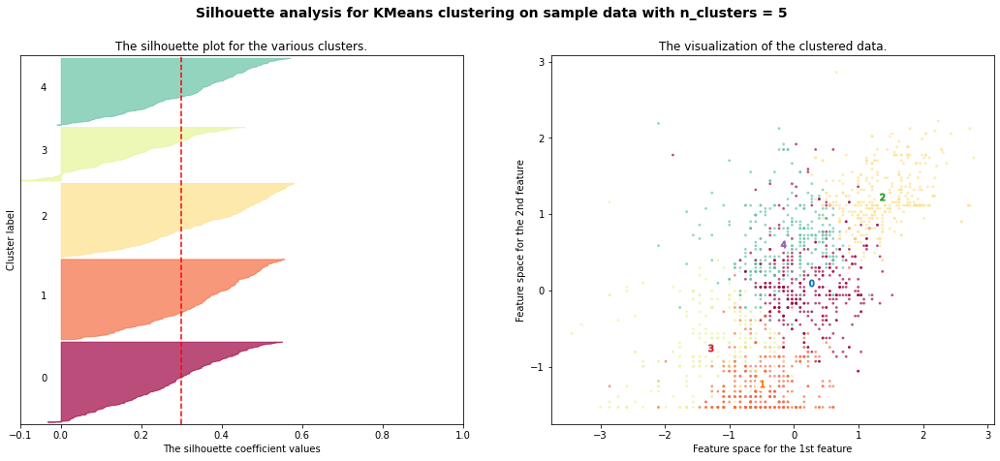

For n_clusters = 6 The average silhouette_score is : 0.2760497956803948


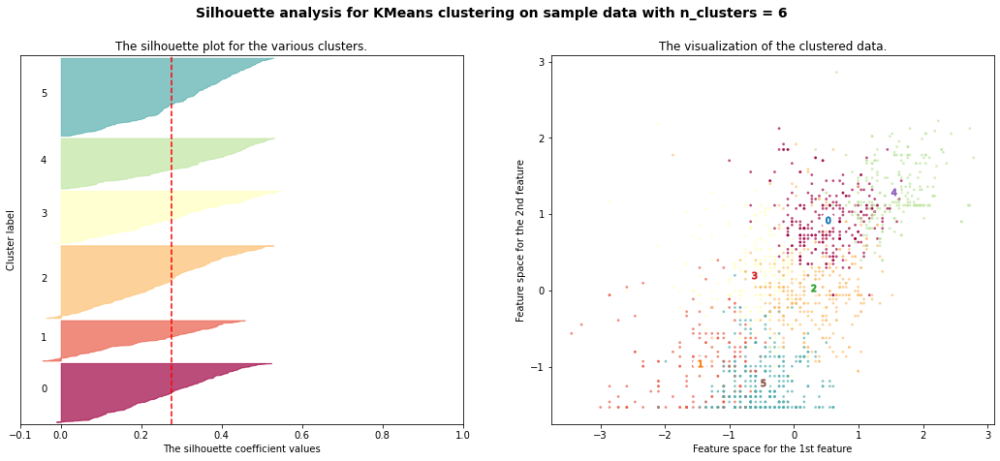

For n_clusters = 7 The average silhouette_score is : 0.27921904590699415


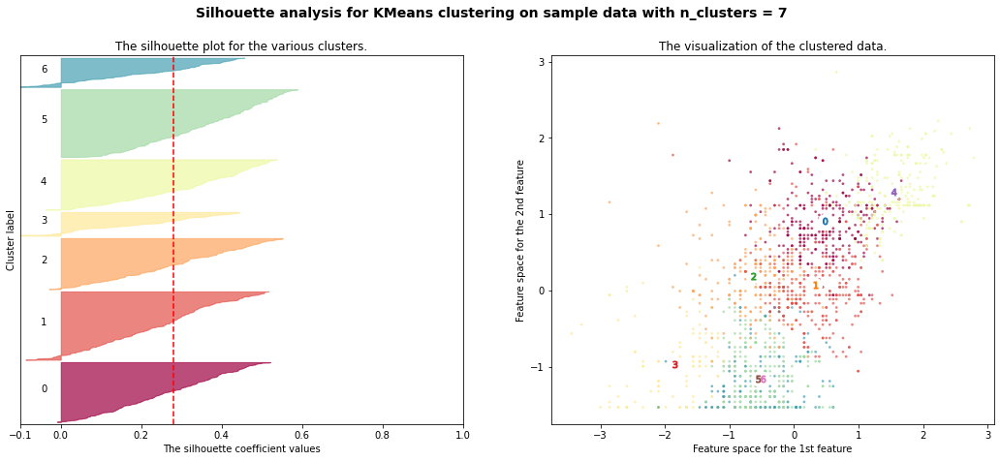

For n_clusters = 8 The average silhouette_score is : 0.2749652115405177


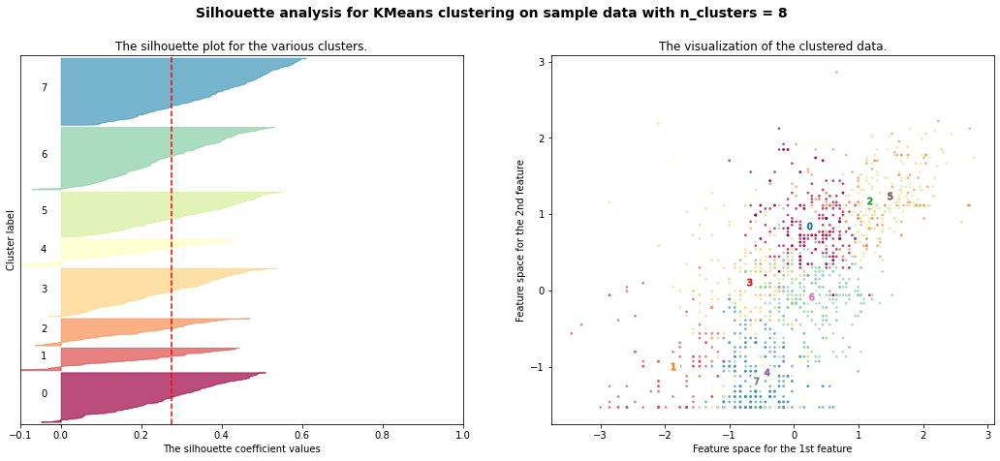

For n_clusters = 9 The average silhouette_score is : 0.27253926946868884


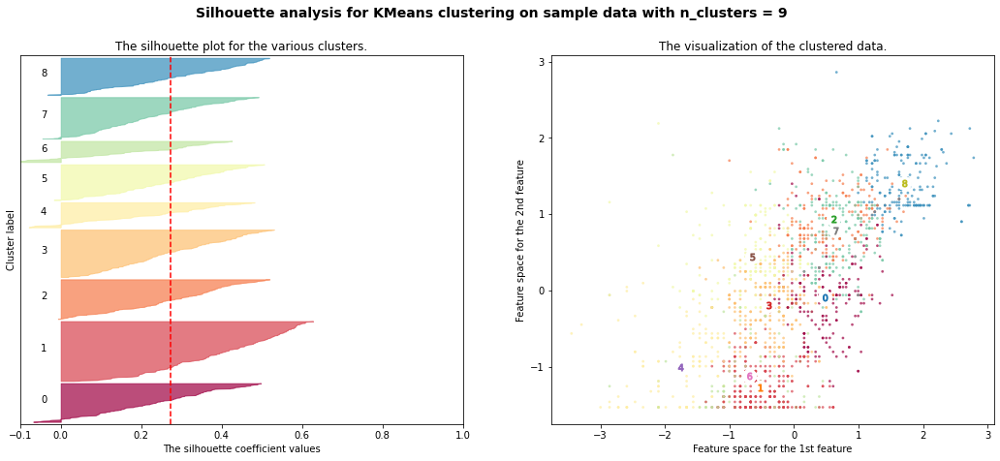

For n_clusters = 10 The average silhouette_score is : 0.2728948244477453


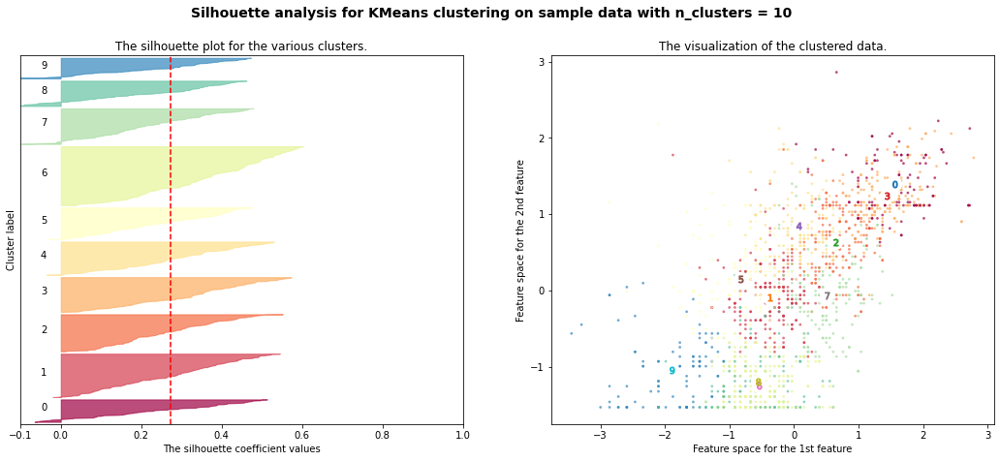

For n_clusters = 11 The average silhouette_score is : 0.2745868930889013


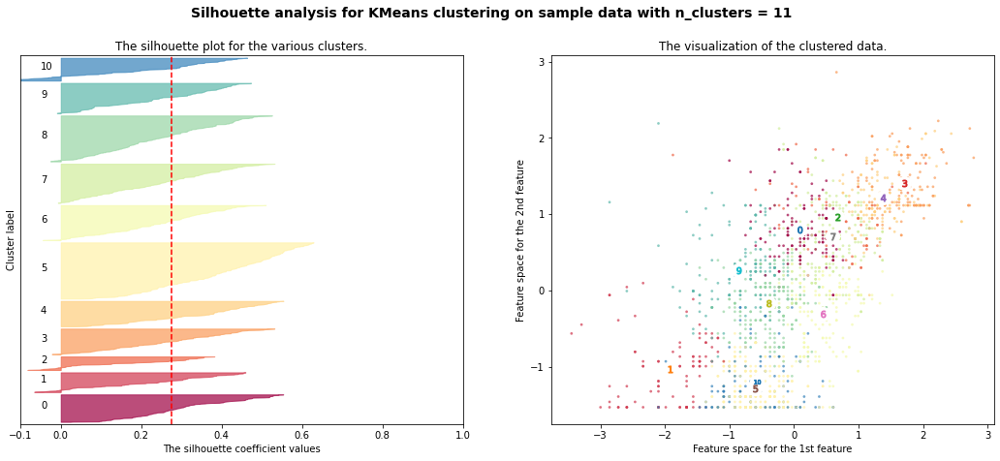

For n_clusters = 12 The average silhouette_score is : 0.27026718158677415


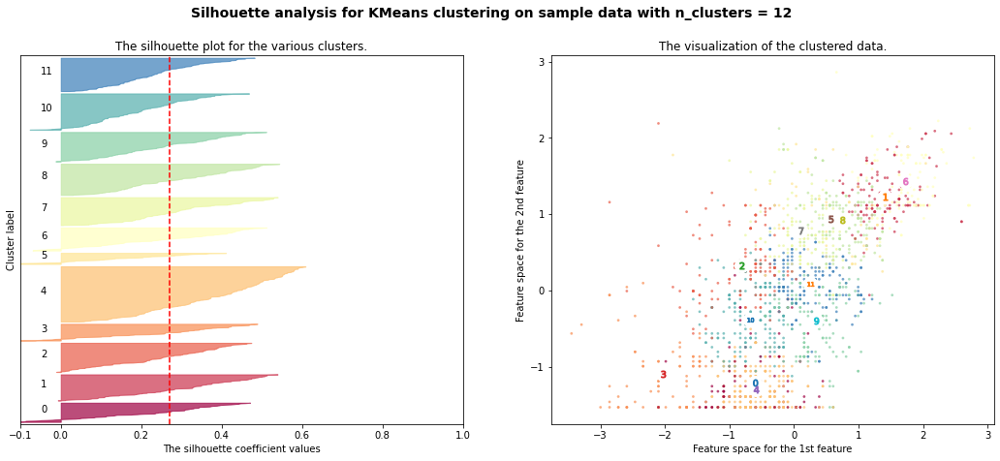

For n_clusters = 13 The average silhouette_score is : 0.27097486512883096


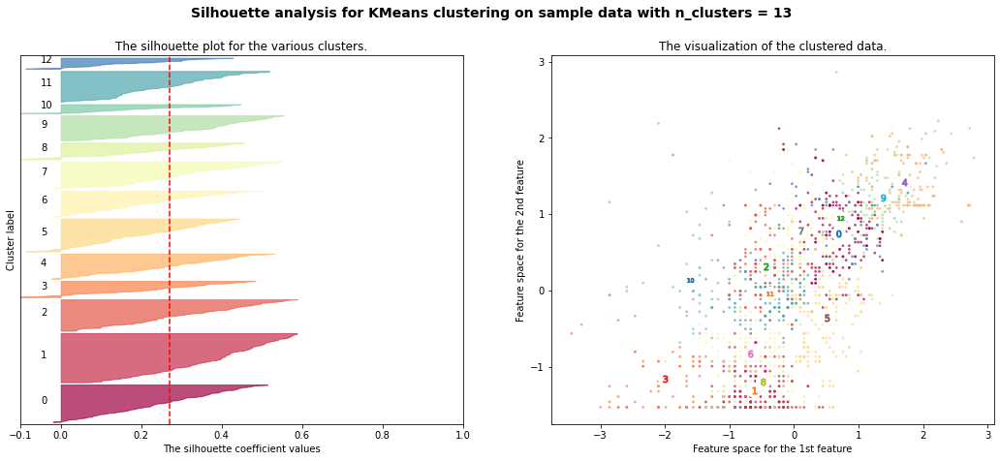

For n_clusters = 14 The average silhouette_score is : 0.25903916091110957


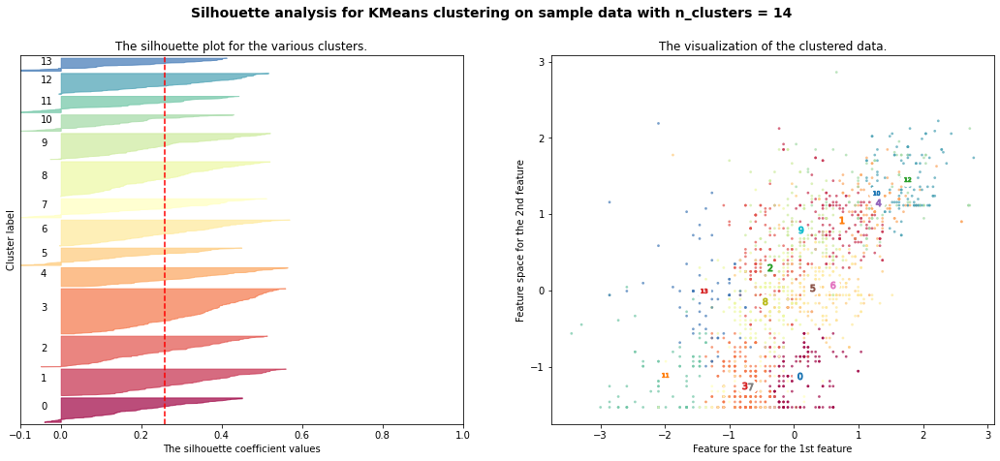

For n_clusters = 15 The average silhouette_score is : 0.26703355626695496


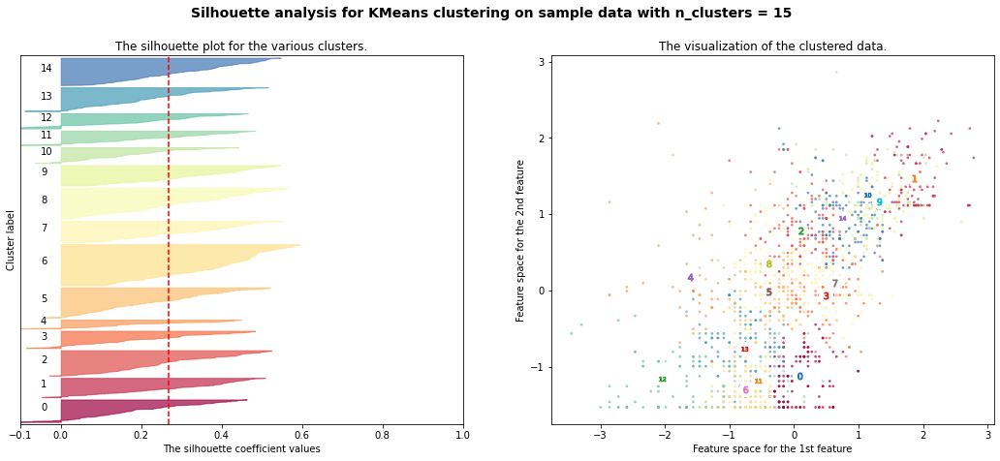

In [169]:
from __future__ import print_function
%matplotlib inline


from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X = x5.values
range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10,11,12,13,14,15]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,n_init=15, random_state=2)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In this case 2 clusters seem to be a good option.

### 6. Use feautes density and pH

In [54]:
x6 = x[['density','pH']]

In [170]:
cluster_range = np.arange(1,16)
cluster_error = []

for i in cluster_range:
    c = KMeans(n_clusters=i,n_init=7)
    c.fit(x6)
    cluster_error.append(c.inertia_)
    labels = c.labels_
    centroids = c.cluster_centers_
    
k_means = [KMeans(n_clusters=i,random_state=4).fit(x6) for i in range(1,16)]
sil_score = [silhouette_score(x6,k.labels_) for k in k_means[1:]]

In [57]:
pd.DataFrame({'No of Clusters':cluster_range,'Cluster Errors':cluster_error})

,No of Clusters,Cluster Errors
0,1,3198.000000
1,2,1931.156656
2,3,1515.832137
3,4,1159.506254
4,5,977.046686
5,6,834.177471
6,7,721.693126
7,8,632.740998
8,9,570.292958
9,10,516.968781


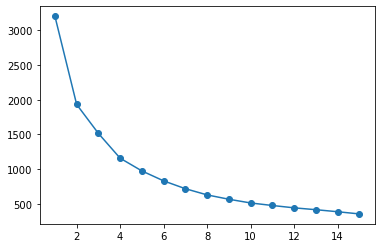

In [58]:
plt.plot(cluster_range,cluster_error,marker='o')

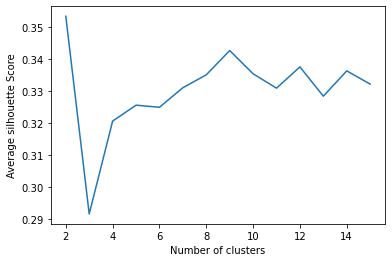

In [171]:
plt.plot(np.arange(2,16),sil_score)
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette Score')
plt.show()

Here also 2 clusters seem to be a good option.